# **Вступление/Introduction:**
Добрый вечер, дамы и господа, позвольте представить вам мои варианты решения задачи. Если я правильно понял лектора, необходимо автоматизировать процесс сегментации изображений МРТ головного мозга на наличие кровоизлияний, причем сделать это без учителя и подсказок./

**Good evening, ladies and gentlemen. Allow me to present to you my proposed solutions for the given task. If I understood the lecturer correctly, the objective is to automate the process of segmenting brain MRI images to detect the presence of hemorrhages, without the use of supervision or hints.**

# **Загружаем библиотеки и предоставленные картинки/Loading libraries and provided images.**

In [ ]:
import os
import numpy as np
from skimage.io import imread
from skimage.transform import resize
from PIL import Image
import cv2
from keras.layers import Input, Conv2D, Flatten, Dense, Dropout, Reshape, MaxPooling2D, UpSampling2D, concatenate
from keras.models import Model
from keras.utils import Sequence
from tensorflow.keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
import random
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dropout
import tensorflow as tf

In [ ]:
from google.colab import drive #подключаю диск
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"
image_files = os.listdir(images_folder)

In [ ]:
image_sizes = []
for image_file in image_files:
    image_path = os.path.join(images_folder, image_file)
    image = imread(image_path)
    image_sizes.append(image.shape)

print(image_sizes)

[(512, 512), (512, 512), (512, 512), (512, 512), (512, 512), (512, 512), (512, 512), (512, 512), (512, 512), (512, 512)]


# **Методы автосегментации БЕЗ УЧИТЕЛЯ / Unsupervised image segmentation methods.**




## **Эксперимент с прменением пороговой сегментации/Experiment with the application of threshold segmentation**

Пороговая сегментация - это простой метод сегментации изображений, основанный на задании порогового значения и классификации пикселей в две категории: пиксели, значения которых выше порогового значения, относятся к одному классу, а пиксели, значения которых ниже порогового значения, относятся к другому классу.

Методика пороговой сегментации заключается в следующих шагах:

Выбор порогового значения: Первым шагом необходимо выбрать пороговое значение, которое будет использоваться для разделения пикселей на два класса.

Применение порога: Затем применяется пороговое значение к каждому пикселю изображения. Если значение пикселя превышает пороговое значение, то этот пиксель относится к одному классу, иначе он относится к другому классу.

Создание бинарной маски: После применения порога, полученные классы пикселей можно представить в виде бинарной маски, где пиксели одного класса обозначены белым цветом, а пиксели другого класса - черным цветом.

Метод пороговой сегментации прост в реализации и позволяет быстро выделить объекты на изображении, если разделение объектов и фона основано на значении яркости или интенсивности пикселей. Однако, он имеет свои ограничения, такие как чувствительность к изменениям освещения и шуму, а также неэффективность в случаях, когда объекты на изображении имеют схожую яркость или интенсивность с фоном.

Thresholding segmentation is a simple image segmentation method based on setting a threshold value and classifying pixels into two categories: pixels with values above the threshold are assigned to one class, while pixels with values below the threshold are assigned to another class.

The methodology of thresholding segmentation involves the following steps:

Threshold value selection: The first step is to choose a threshold value that will be used to separate pixels into two classes.

Applying the threshold: The chosen threshold value is then applied to each pixel of the image. If a pixel's value exceeds the threshold, it belongs to one class; otherwise, it belongs to the other class.

Creating a binary mask: After applying the threshold, the resulting pixel classes can be represented as a binary mask, where pixels of one class are denoted by white color, and pixels of the other class are denoted by black color.

The thresholding segmentation method is easy to implement and allows for quick extraction of objects in an image if the separation between objects and the background is based on brightness or intensity values. However, it has limitations such as sensitivity to changes in illumination and noise, as well as inefficiency when objects in the image have similar brightness or intensity to the background.

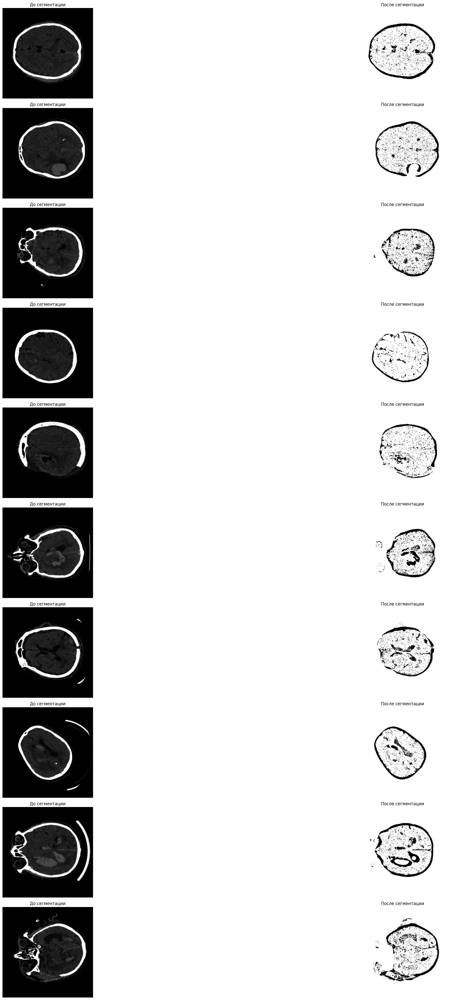

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сегментированные изображения пороговые"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Пороговое значение для отфильтрования белых и черных пикселей
black_threshold = 45
white_threshold = 255

# Параметры адаптивной пороговой сегментации
block_size = 51
constant = 10

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(40, 40))

# Применение предварительной обработки и адаптивной пороговой сегментации к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого

    # Предварительная обработка: отфильтровать белые и черные пиксели
    filtered_image = cv2.bitwise_and(image, cv2.bitwise_not(cv2.inRange(image, black_threshold, white_threshold)))

    # Применение адаптивной пороговой сегментации
    segmented_image = cv2.adaptiveThreshold(filtered_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, constant)

    # Отображение изображений до и после сегментации
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(segmented_image, cmap='gray')
    axs[i, 1].set_title('После сегментации')
    axs[i, 1].axis('off')

    # Сохранение изображения
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, segmented_image)

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

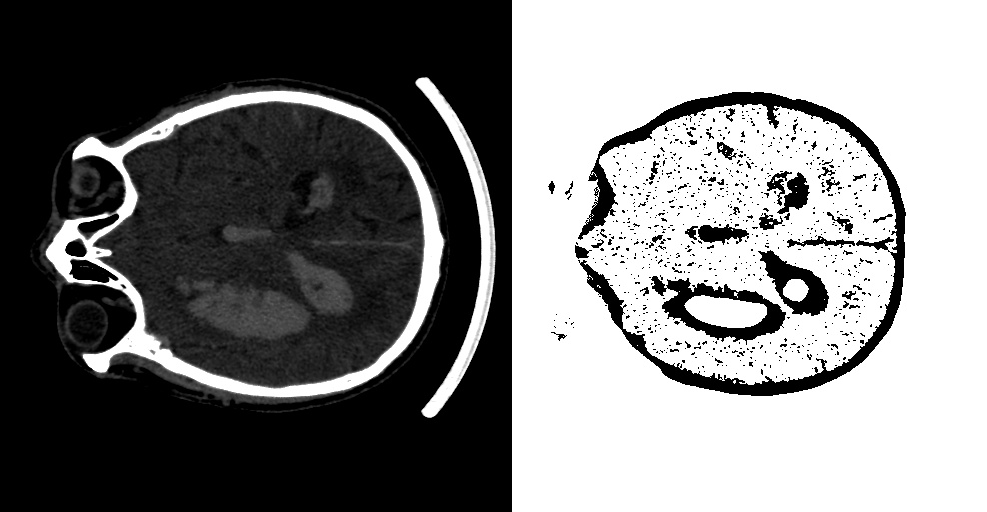

## **Эксперимент с водоразделом/Experiment with watershed segmentation**

Метод автосегментации "водораздел" (англ. watershed segmentation) является одним из популярных подходов к сегментации изображений. Он основан на аналогии с процессом распределения воды по географическим водоразделам.

Основная идея метода заключается в рассмотрении изображения как ландшафта, где яркость пикселей интерпретируется как высота. Вначале применяется преобразование градиента к изображению, чтобы выделить регионы с яркостными перепадами. Затем строится граф, где пиксели представлены как вершины, а связи между ними задаются на основе градиента. Алгоритм последовательно заполняет регионы водой, начиная с предполагаемых точек водораздела, и расширяет их до достижения границ соседних регионов.

Процесс сегментации заканчивается, когда вода из разных источников сойдется в одном регионе, образуя окончательные сегменты изображения.

Метод водораздел обладает способностью обнаруживать объекты различных форм и размеров, а также хорошо справляется с изображениями, содержащими яркостные перепады и текстуры. Однако у него есть некоторые ограничения, включая чувствительность к шуму и зависимость от начальных точек водораздела, которые могут сильно влиять на конечный результат сегментации.

The method of unsupervised auto-segmentation called "watershed segmentation" is one of the popular approaches in image segmentation. It is based on the analogy of water distribution on geographical watersheds.

The main idea of the watershed method is to consider an image as a landscape, where pixel intensities are interpreted as heights. Initially, a gradient transformation is applied to the image to highlight regions with intensity variations. Then, a graph is constructed where pixels are represented as nodes and connections between them are based on the gradient. The algorithm gradually fills regions with water, starting from presumed watershed points, and expands them until they reach the boundaries of neighboring regions.

The segmentation process terminates when the water from different sources converges into a single region, forming the final segmented regions of the image.

The watershed method has the ability to detect objects of various shapes and sizes and performs well on images with intensity variations and textures. However, it has certain limitations, including sensitivity to noise and dependency on the initial watershed points, which can significantly affect the final segmentation result.

In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сегментированные изображения водораздел"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Применение метода водораздела с новым порогом к каждому изображению
for filename in image_files:
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Исключение белых пикселей
    white_threshold = 240
    masked_image = np.where(gray_image >= white_threshold, 0, gray_image)

    # Новый порог для метода водораздела
    threshold = 50

    # Применение метода водораздела с новым порогом
    _, segmented_image = cv2.threshold(masked_image, threshold, 255, cv2.THRESH_BINARY_INV)

    # Сохранение изображения в формате оттенков серого
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, segmented_image)

print("Изображения сохранены.")

Изображения сохранены.


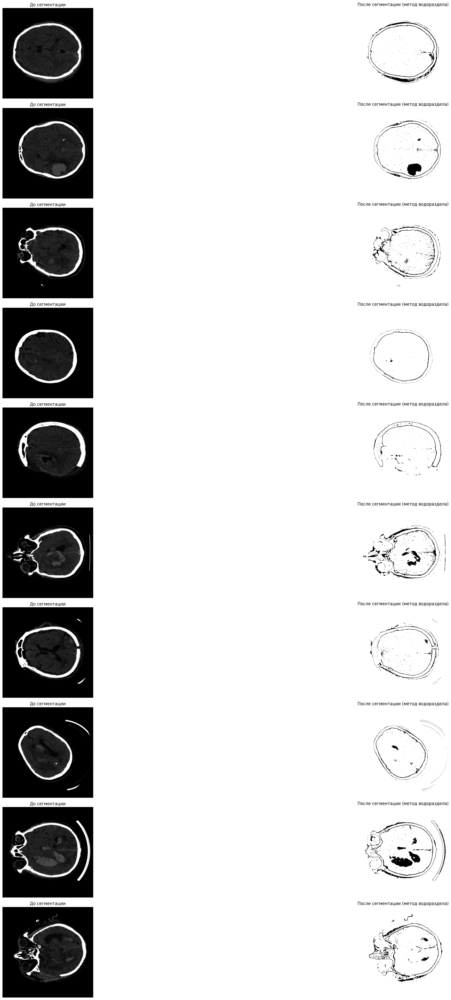

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сегментированные изображения водораздел"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(40, 40))

# Применение метода водораздела с новым порогом к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Исключение белых пикселей
    white_threshold = 240
    masked_image = np.where(gray_image >= white_threshold, 0, gray_image)

    # Новый порог для метода водораздела
    threshold = 50

    # Применение метода водораздела с новым порогом
    _, segmented_image = cv2.threshold(masked_image, threshold, 255, cv2.THRESH_BINARY_INV)

    # Отображение изображений до и после сегментации
    axs[i, 0].imshow(image)
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(segmented_image, cmap='gray')
    axs[i, 1].set_title('После сегментации (метод водораздела)')
    axs[i, 1].axis('off')

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

Результат работы кода виден ниже

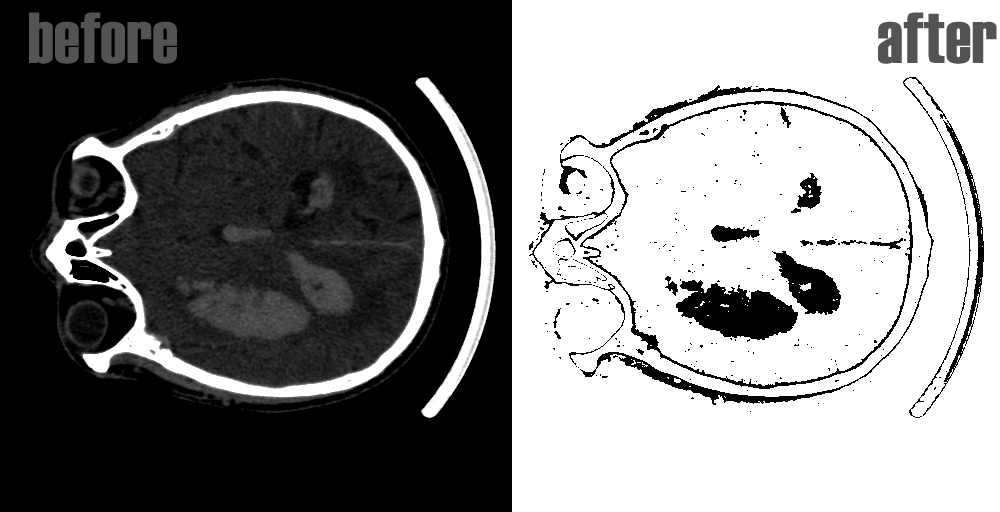

Попытка выделить только внутреннюю область (внутри черепа)

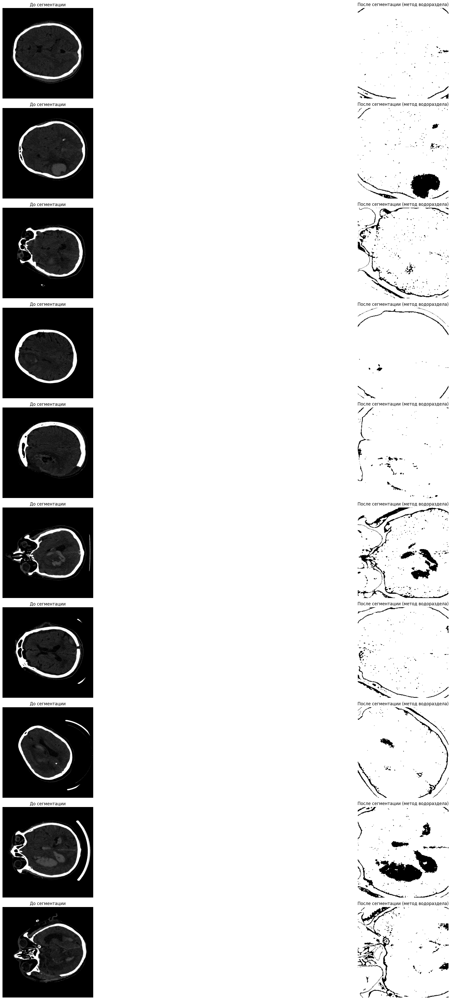

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сегментированные изображения водораздел"

# Размер центральной области
crop_size = 256

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(40, 40))

# Применение метода водораздела с новым порогом к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого

    # Выделение центральной области
    height, width = image.shape
    start_x = (width - crop_size) // 2
    start_y = (height - crop_size) // 2
    cropped_image = np.zeros((crop_size, crop_size), dtype=np.uint8)
    cropped_image[:,:] = 255  # Заполнение белым цветом
    cropped_image[:,:] = image[start_y:start_y + crop_size, start_x:start_x + crop_size]

    # Исключение белых пикселей
    white_threshold = 240
    masked_image = np.where(cropped_image >= white_threshold, 0, cropped_image)

    # Новый порог для метода водораздела
    threshold = 50

    # Применение метода водораздела с новым порогом
    _, segmented_image = cv2.threshold(masked_image, threshold, 255, cv2.THRESH_BINARY_INV)

    # Сохранение изображения в формате оттенков серого
    #output_path = os.path.join(output_folder, filename)
    #cv2.imwrite(output_path, segmented_image)

    # Отображение изображений до и после сегментации
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(segmented_image, cmap='gray')
    axs[i, 1].set_title('После сегментации (метод водораздела)')
    axs[i, 1].axis('off')

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

## **Эксперимент с применением алгоритма Кэнни/Experiment with applying the Canny algorithm**

Алгоритм Кэнни (Canny edge detection) является одним из наиболее популярных методов обнаружения границ на изображениях. Он был разработан Джоном Ф. Кэнни в 1986 году.

Основная идея алгоритма Кэнни заключается в следующих шагах:

Сглаживание изображения: Изначально, входное изображение проходит через фильтр сглаживания, например, фильтр Гаусса, чтобы снизить шум и устранить ненужные детали.

Вычисление градиента яркости: Затем, применяется оператор градиента, обычно оператор Собеля, для вычисления градиента яркости в каждой точке изображения. Градиент показывает изменение яркости в разных направлениях.

Подавление немаксимумов: Далее, производится подавление немаксимумов, чтобы выделить только локальные максимумы в направлении градиента. Это позволяет сохранить тонкие грани и уменьшить ширину границ.

Двойной порог: Затем, применяется двойной пороговый фильтр, чтобы определить, какие границы будут считаться ребрами. Высокий порог и низкий порог устанавливаются пользователем. Пиксели с градиентом выше высокого порога считаются сильными ребрами, пиксели с градиентом между высоким и низким порогами могут быть считаны слабыми ребрами или подавлены, а пиксели с градиентом ниже низкого порога отбрасываются.

Связывание границ: Наконец, применяется процесс связывания границ, чтобы соединить слабые ребра сильными ребрами и получить окончательные обнаруженные границы.

Алгоритм Кэнни обладает несколькими преимуществами, включая хорошую точность обнаружения границ, способность справляться с шумом и способность сохранять тонкие детали границ. Он широко используется в различных приложениях компьютерного зрения и обработки изображений.

The Canny algorithm (Canny edge detection) is one of the most popular methods for edge detection in images. It was developed by John F. Canny in 1986.

The main idea of the Canny algorithm can be summarized in the following steps:

Image Smoothing: The input image is initially passed through a smoothing filter, such as a Gaussian filter, to reduce noise and eliminate unnecessary details.

Gradient Computation: Next, a gradient operator, typically the Sobel operator, is applied to compute the gradient magnitude and direction at each point of the image. The gradient represents the change in brightness in different directions.

Non-maximum Suppression: Subsequently, non-maximum suppression is performed to highlight only the local maxima along the gradient direction. This step helps to preserve thin edges and reduce the width of the detected edges.

Double Thresholding: Then, a double thresholding technique is applied to determine which edges will be considered as actual edges. The high and low thresholds are set by the user. Pixels with a gradient magnitude above the high threshold are considered strong edges, pixels with a gradient magnitude between the high and low thresholds can be considered weak edges or suppressed, and pixels with a gradient magnitude below the low threshold are discarded.

Edge Linking: Finally, an edge linking process is applied to connect weak edges to strong edges and obtain the final detected edges.

The Canny algorithm offers several advantages, including accurate edge detection, ability to handle noise, and preservation of fine edge details. It is widely used in various applications of computer vision and image processing.

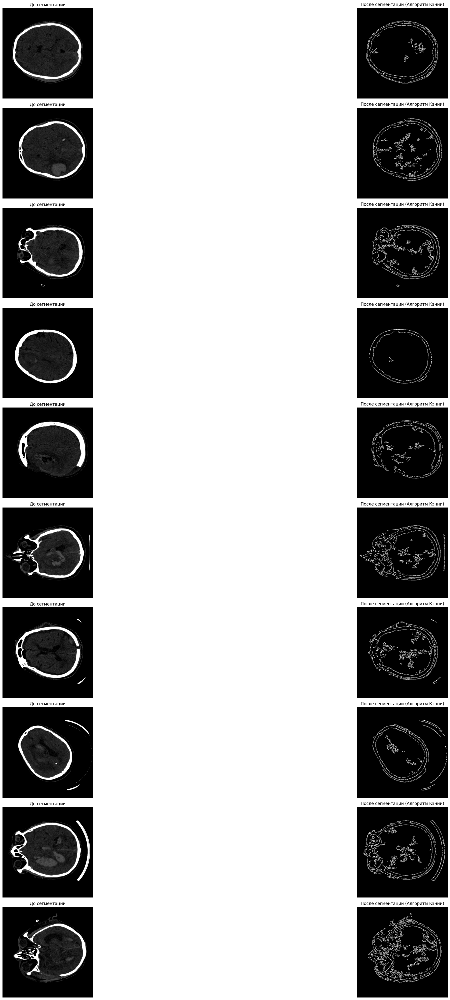

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сегментированные изображения алгоритм Кэнни"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Пороговые значения для отфильтровывания белых пикселей
white_threshold = 180

# Пороговые значения для алгоритма Кэнни
low_threshold = 35
high_threshold = 175

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(40, 40))

# Применение предварительной обработки и алгоритма Кэнни к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого

    # Предварительная обработка: отфильтровать белые пиксели
    filtered_image = np.where(image >= white_threshold, 0, image)

    # Применение алгоритма Кэнни
    edges = cv2.Canny(filtered_image, low_threshold, high_threshold)

    # Отображение изображений до и после сегментации
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(edges, cmap='gray')
    axs[i, 1].set_title('После сегментации (Алгоритм Кэнни)')
    axs[i, 1].axis('off')

    # Сохранение изображения
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, edges)

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

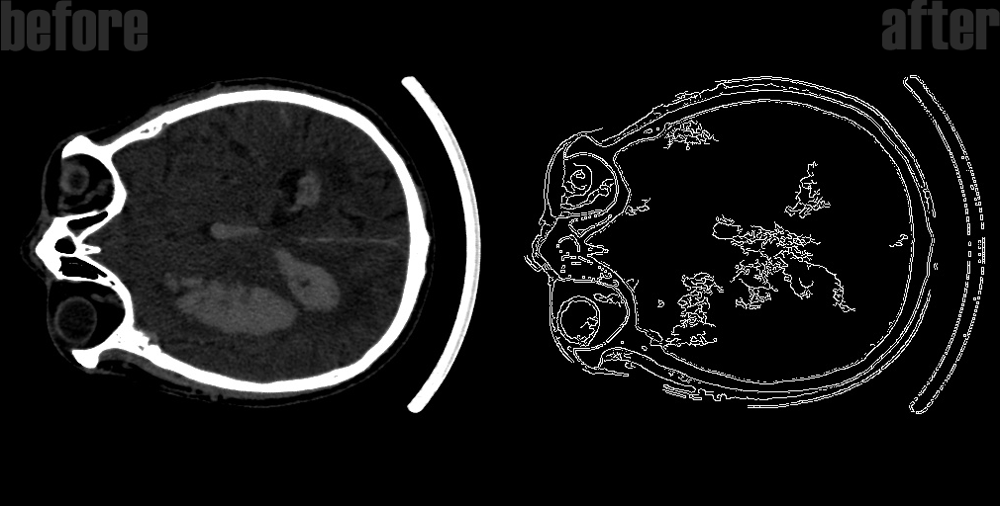

## **Эксперимент с методом регионального роста/Experiment with the region growing method**

Метод регионального роста (Region Growing) является одним из методов сегментации изображений. Он используется для автоматического выделения регионов схожих пикселей на основе их интенсивности или других характеристик.

Процесс регионального роста можно описать следующим образом:

Выбор начального пикселя: В качестве начального пикселя выбирается определенный пиксель изображения, который является зерном региона.

Определение условия роста: Задается условие, определяющее, должен ли пиксель быть добавлен в регион. Это условие может быть основано на различных характеристиках, таких как интенсивность пикселя, цвет, текстура или другие атрибуты.

Рост региона: Начиная с начального пикселя, процесс регионального роста распространяется на соседние пиксели, проверяя условие роста. Если пиксель удовлетворяет условию, он добавляется в регион, и процесс продолжается для его соседних пикселей. Этот шаг повторяется до тех пор, пока больше пикселей не может быть добавлено к региону.

Повторение для остальных регионов: Если на изображении присутствуют несколько регионов, процесс регионального роста повторяется для каждого региона, начиная с разных начальных пикселей или с использованием различных условий роста.

Метод регионального роста позволяет автоматически выделять регионы на основе их схожести и упрощает процесс сегментации изображений. Он может быть использован для различных задач, таких как выделение объектов, обнаружение контуров или анализ текстур.

The Region Growing method is one of the image segmentation techniques used to automatically identify regions of similar pixels based on their intensity or other characteristics.

The process of region growing can be described as follows:

Seed pixel selection: A specific pixel in the image is chosen as the seed pixel, which serves as the starting point of the region.

Definition of the growth criteria: A growth criterion is defined to determine whether a pixel should be added to the region. This criterion can be based on various characteristics, such as pixel intensity, color, texture, or other attributes.

Region growth: Starting from the seed pixel, the region growing process expands to neighboring pixels, checking the growth criterion. If a pixel satisfies the criterion, it is added to the region, and the process continues for its neighboring pixels. This step is repeated until no more pixels can be added to the region.

Iteration for other regions: If there are multiple regions in the image, the region growing process is repeated for each region, starting from different seed pixels or using different growth criteria.

The region growing method allows for automatic segmentation of regions based on their similarity, simplifying the image segmentation process. It can be used for various tasks, such as object extraction, contour detection, or texture analysis.

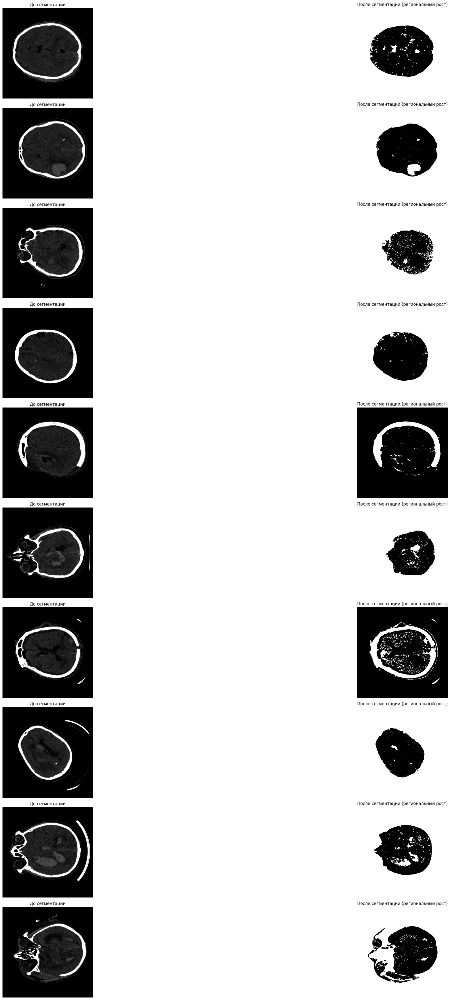

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сохраненные изображения"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Параметры метода регионального роста
seed_point = (256, 256)  # Начальная точка (семя)
similarity_threshold = 26  # Порог схожести пикселей

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(40, 40))

# Применение метода регионального роста к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого

    # Применение метода регионального роста
    region_grown_image = np.zeros_like(image)  # Создание пустого изображения для результата
    visited = np.zeros_like(image, dtype=np.uint8)  # Массив для отслеживания посещенных пикселей

    stack = []  # Стек для хранения пикселей для обработки
    stack.append(seed_point)  # Добавление начальной точки в стек

    while stack:
        x, y = stack.pop()  # Извлечение пикселя из стека

        if visited[x, y] == 1:
            continue
        visited[x, y] = 1

        if abs(int(image[x, y]) - int(image[seed_point])) <= similarity_threshold:
            region_grown_image[x, y] = 230  # Установка пикселя в белый цвет

            # Добавление соседних пикселей в стек для обработки
            if x > 0:
                stack.append((x - 1, y))
            if x < image.shape[0] - 1:
                stack.append((x + 1, y))
            if y > 0:
                stack.append((x, y - 1))
            if y < image.shape[1] - 1:
                stack.append((x, y + 1))

    # Инвертирование цветов
    inverted_image = cv2.bitwise_not(region_grown_image)

    # Отображение изображений до и после сегментации
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(inverted_image, cmap='gray')
    axs[i, 1].set_title('После сегментации (региональный рост)')
    axs[i, 1].axis('off')

    # Сохранение изображения
    #output_path = os.path.join(output_folder, filename)
    #cv2.imwrite(output_path, inverted_image)

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

## **Эксперимент. Региональный рост + эррозия + расширение/Experiment: Region Growing + Erosion + Dilation**

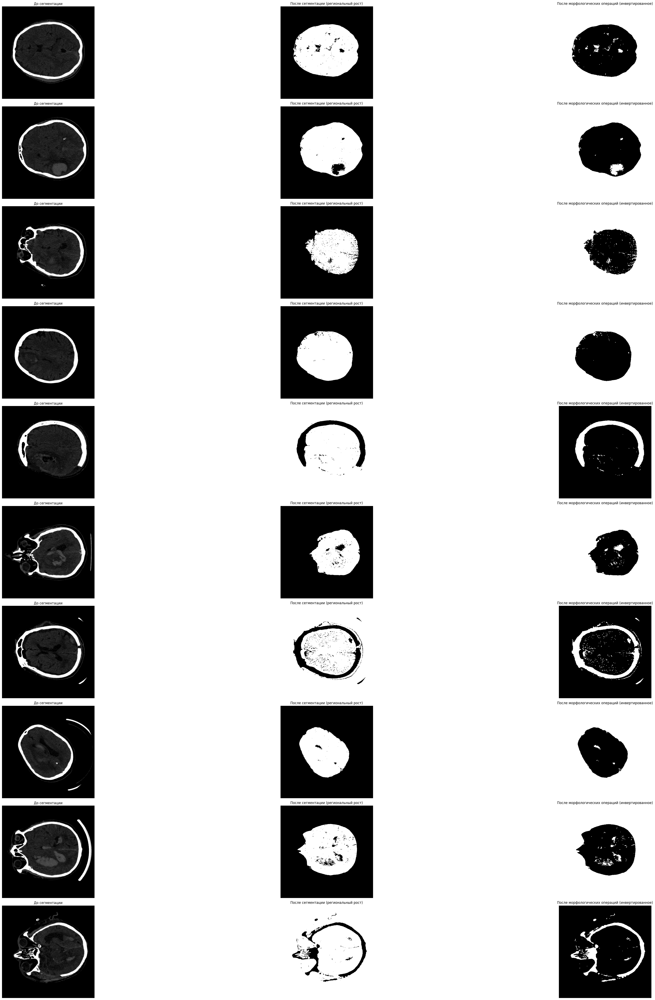

Изображения сохранены.


In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/сохраненные изображения"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Параметры метода регионального роста
seed_point = (256, 256)  # Начальная точка (семя)
similarity_threshold = 30  # Порог схожести пикселей

# Параметры морфологических операций
kernel_size = (2, 2)  # Размер ядра для операций расширения и эрозии
num_iterations = 1  # Количество итераций операций расширения и эрозии

# Создание графика для отображения изображений
fig, axs = plt.subplots(len(image_files), 3, figsize=(50, 50))

# Применение метода регионального роста и морфологических операций к каждому изображению
for i, filename in enumerate(image_files):
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого

    # Применение метода регионального роста
    region_grown_image = np.zeros_like(image)  # Создание пустого изображения для результата
    visited = np.zeros_like(image, dtype=np.uint8)  # Массив для отслеживания посещенных пикселей

    stack = []  # Стек для хранения пикселей для обработки
    stack.append(seed_point)  # Добавление начальной точки в стек

    while stack:
        x, y = stack.pop()  # Извлечение пикселя из стека

        if visited[x, y] == 1:
            continue
        visited[x, y] = 1

        if abs(int(image[x, y]) - int(image[seed_point])) <= similarity_threshold:
            region_grown_image[x, y] = 255  # Установка пикселя в белый цвет

            # Добавление соседних пикселей в стек для обработки
            if x > 0:
                stack.append((x - 1, y))
            if x < image.shape[0] - 1:
                stack.append((x + 1, y))
            if y > 0:
                stack.append((x, y - 1))
            if y < image.shape[1] - 1:
                stack.append((x, y + 1))

    # Применение операции расширения
    dilated_image = cv2.dilate(region_grown_image, np.ones(kernel_size, np.uint8), iterations=num_iterations)

    # Применение операции эрозии
    eroded_image = cv2.erode(dilated_image, np.ones(kernel_size, np.uint8), iterations=num_iterations)

    # Инвертирование цветов
    inverted_image = cv2.bitwise_not(eroded_image)

    # Отображение изображений до и после сегментации и морфологических операций
    axs[i, 0].imshow(image, cmap='gray')
    axs[i, 0].set_title('До сегментации')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(region_grown_image, cmap='gray')
    axs[i, 1].set_title('После сегментации (региональный рост)')
    axs[i, 1].axis('off')

    axs[i, 2].imshow(inverted_image, cmap='gray')
    axs[i, 2].set_title('После морфологических операций (инвертированное)')
    axs[i, 2].axis('off')

    # Сохранение изображения
    # output_path = os.path.join(output_folder, filename)
    # cv2.imwrite(output_path, inverted_image)

# Отображение графика с изображениями
plt.tight_layout()
plt.show()

print("Изображения сохранены.")

# **Автосегментация - автоэнкодер (без учителя, без масок)**

Epoch 1/10
1/1 [==============================] - 20s 20s/step - loss: 0.6931
Epoch 2/10
1/1 [==============================] - 15s 15s/step - loss: 0.6869
Epoch 3/10
1/1 [==============================] - 15s 15s/step - loss: 0.6773
Epoch 4/10
1/1 [==============================] - 15s 15s/step - loss: 0.6633
Epoch 5/10
1/1 [==============================] - 18s 18s/step - loss: 0.6416
Epoch 6/10
1/1 [==============================] - 15s 15s/step - loss: 0.6087
Epoch 7/10
1/1 [==============================] - 15s 15s/step - loss: 0.5616
Epoch 8/10
1/1 [==============================] - 17s 17s/step - loss: 0.4959
Epoch 9/10
1/1 [==============================] - 15s 15s/step - loss: 0.4117
Epoch 10/10
1/1 [==============================] - 3s 3s/step


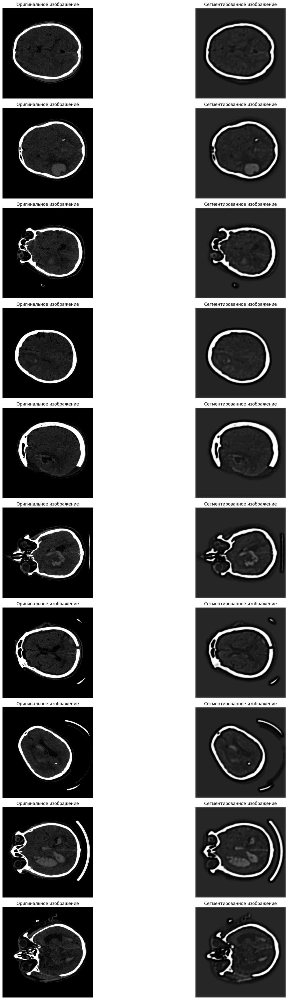

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D

# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/снимки МРТ"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Подготовка данных
images = []
for filename in image_files:
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path, 0)  # Загрузка в оттенках серого
    images.append(image)

images = np.array(images)
images = images.astype('float32') / 255.0  # Нормализация значений пикселей

# Создание и обучение автоэнкодера
input_shape = (512, 512, 1)  # Размер входных изображений
latent_dim = 64  # Размер скрытого представления (кодирование)

# Энкодер
inputs = Input(shape=input_shape)
x = Conv2D(32, 3, activation='relu', padding='same')(inputs)
x = MaxPooling2D(2)(x)
x = Conv2D(64, 3, activation='relu', padding='same')(x)
x = MaxPooling2D(2)(x)
x = Conv2D(latent_dim, 3, activation='relu', padding='same')(x)

# Декодер
x = Conv2D(64, 3, activation='relu', padding='same')(x)
x = UpSampling2D(2)(x)
x = Conv2D(32, 3, activation='relu', padding='same')(x)
x = UpSampling2D(2)(x)
outputs = Conv2D(1, 3, activation='sigmoid', padding='same')(x)

autoencoder = Model(inputs, outputs)
autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
autoencoder.fit(images, images, epochs=10, batch_size=16)

# Применение автоэнкодера для генерации сегментированных изображений
segmented_images = autoencoder.predict(images)

# Отображение оригинальных и сегментированных изображений
fig, axs = plt.subplots(len(image_files), 2, figsize=(20, 40))

for i in range(len(image_files)):
    axs[i, 0].imshow(images[i], cmap='gray')
    axs[i, 0].set_title('Оригинальное изображение')
    axs[i, 0].axis('off')

    axs[i, 1].imshow(segmented_images[i], cmap='gray')
    axs[i, 1].set_title('Сегментированное изображение')
    axs[i, 1].axis('off')

plt.tight_layout()
plt.show()

# **U-net с масками заданными ранее другими методами**

(Будем использовать водораздел, так как он показал, как мне кажется, наилучший результат)
Взял пока только 2 тыс. снимков для тренировки U-net
Сам по себе водораздел показывает хороший результат, но посмотрим что сможет u-net натренированная на этих масках.

Сегментированные изображения, были обработаны без учителя, без масок, без ручной сегментации.

(We will use the Watershed method as it has shown, in my opinion, the best results) We have only taken 2,000 images so far for training the U-net. The Watershed method itself shows good results, but let's see what a U-net trained on these masks can achieve.

The segmented images were processed without a teacher, without masks, and without manual segmentation.

In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/Полный комплект снимков МРТ"

# Выходная папка для сохранения изображений
output_folder = "/content/drive/MyDrive/хакатон/маски"

# Загрузка списка файлов изображений
image_files = os.listdir(images_folder)

# Применение метода водораздела с новым порогом к каждому изображению
for filename in image_files:
    # Загрузка изображения
    image_path = os.path.join(images_folder, filename)
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Исключение белых пикселей
    white_threshold = 240
    masked_image = np.where(gray_image >= white_threshold, 0, gray_image)

    # Новый порог для метода водораздела
    threshold = 50

    # Применение метода водораздела с новым порогом
    _, segmented_image = cv2.threshold(masked_image, threshold, 255, cv2.THRESH_BINARY_INV)

    # Сохранение изображения в формате оттенков серого
    output_path = os.path.join(output_folder, filename)
    cv2.imwrite(output_path, segmented_image)

print("Изображения сохранены.")

Изображения сохранены.


## **Эксперимент с U-net**

In [ ]:
# Путь к папке с изображениями МРТ
images_folder = "/content/drive/MyDrive/хакатон/Полный комплект снимков МРТ"
# Путь к папке с масками
masks_folder = "/content/drive/MyDrive/хакатон/маски"

# Загрузка списка файлов изображений и масок
image_files = os.listdir(images_folder)
mask_files = os.listdir(masks_folder)

# Создание словаря для хранения соответствия оригинальных изображений и масок
image_mask_mapping = {}

# Поиск соответствующих файлов оригинальных изображений и масок
for image_file in image_files:
    # Извлечение имени файла без расширения
    image_filename = os.path.splitext(image_file)[0]

    # Поиск соответствующей маски
    matching_masks = [mask_file for mask_file in mask_files if mask_file.startswith(image_filename)]

    # Проверка, что найдена ровно одна маска
    if len(matching_masks) == 1:
        mask_file = matching_masks[0]
        image_mask_mapping[image_file] = mask_file

# Создание генератора данных для изображений и масок
def data_generator(image_files, mask_files, batch_size):
    num_samples = len(image_files)
    steps_per_epoch = num_samples // batch_size
    while True:
        np.random.shuffle(image_files)
        for i in range(steps_per_epoch):
            batch_image_files = image_files[i * batch_size : (i + 1) * batch_size]
            batch_mask_files = [image_mask_mapping[filename] for filename in batch_image_files]
            batch_images = []
            batch_masks = []
            for image_file, mask_file in zip(batch_image_files, batch_mask_files):
                image_path = os.path.join(images_folder, image_file)
                image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
                image = image / 255.0  # Нормализация значений пикселей
                batch_images.append(image)

                mask_path = os.path.join(masks_folder, mask_file)
                mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
                mask = mask / 255.0  # Нормализация значений пикселей
                batch_masks.append(mask)

            batch_images = np.array(batch_images).reshape(-1, input_shape[0], input_shape[1], 1)
            batch_masks = np.array(batch_masks).reshape(-1, input_shape[0], input_shape[1], 1)

            yield batch_images, batch_masks

# Создание модели U-Net
input_shape = (256, 256)
inputs = Input(input_shape + (1,))  # Указание количества каналов (серое изображение)

# Энкодер
conv1 = Conv2D(32, 3, activation='relu', padding='same')(inputs)
conv1 = Conv2D(32, 3, activation='relu', padding='same')(conv1)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

conv2 = Conv2D(64, 3, activation='relu', padding='same')(pool1)
conv2 = Conv2D(64, 3, activation='relu', padding='same')(conv2)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

conv3 = Conv2D(128, 3, activation='relu', padding='same')(pool2)
conv3 = Conv2D(128, 3, activation='relu', padding='same')(conv3)
pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

conv4 = Conv2D(256, 3, activation='relu', padding='same')(pool3)
conv4 = Conv2D(256, 3, activation='relu', padding='same')(conv4)
drop4 = Dropout(0.5)(conv4)
pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

conv5 = Conv2D(512, 3, activation='relu', padding='same')(pool4)
conv5 = Conv2D(512, 3, activation='relu', padding='same')(conv5)
drop5 = Dropout(0.5)(conv5)

# Декодер
up6 = Conv2D(256, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(drop5))
merge6 = concatenate([drop4, up6], axis=3)
conv6 = Conv2D(256, 3, activation='relu', padding='same')(merge6)
conv6 = Conv2D(256, 3, activation='relu', padding='same')(conv6)

up7 = Conv2D(128, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv6))
merge7 = concatenate([conv3, up7], axis=3)
conv7 = Conv2D(128, 3, activation='relu', padding='same')(merge7)
conv7 = Conv2D(128, 3, activation='relu', padding='same')(conv7)

up8 = Conv2D(64, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv7))
merge8 = concatenate([conv2, up8], axis=3)
conv8 = Conv2D(64, 3, activation='relu', padding='same')(merge8)
conv8 = Conv2D(64, 3, activation='relu', padding='same')(conv8)

up9 = Conv2D(32, 2, activation='relu', padding='same')(UpSampling2D(size=(2, 2))(conv8))
merge9 = concatenate([conv1, up9], axis=3)
conv9 = Conv2D(32, 3, activation='relu', padding='same')(merge9)
conv9 = Conv2D(32, 3, activation='relu', padding='same')(conv9)

outputs = Conv2D(1, 1, activation='sigmoid')(conv9)

def dice_coefficient(y_true, y_pred, smooth=1):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred)
    dice = (2.0 * intersection + smooth) / (union + smooth)
    return dice

model = Model(inputs=inputs, outputs=outputs)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', dice_coefficient])

# Создание объекта ModelCheckpoint для сохранения модели
checkpoint_path = "/content/drive/MyDrive/хакатон/model_checkpoint.h5"
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

# Создание генераторов данных для обучения и валидации
batch_size = 16
train_generator = data_generator(image_files, mask_files, batch_size)
validation_generator = data_generator(image_files, mask_files, batch_size)

# Обучение модели
steps_per_epoch = len(image_files) // batch_size
validation_steps = len(image_files) // batch_size

history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=10,
                    validation_data=validation_generator,
                    validation_steps=validation_steps,
                    callbacks=[checkpoint])

# Загрузка и предобработка изображений для сегментации
#images = []
#for image_file in image_files:
#    image_path = os.path.join(images_folder, image_file)
#    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
#    image = image / 255.0  # Нормализация значений пикселей
#    images.append(image)

#images = np.array(images).reshape(-1, input_shape[0], input_shape[1], 1)

# Сегментация выбранных примеров с использованием модели
#segmented_masks = model.predict(images)

Epoch 1/10
125/125 [==============================] - ETA: 0s - loss: 0.2949 - accuracy: 0.9105 - dice_coefficient: 0.9346
Epoch 1: val_loss improved from inf to 0.06649, saving model to /content/drive/MyDrive/хакатон/model_checkpoint.h5
125/125 [==============================] - 341s 2s/step - loss: 0.2949 - accuracy: 0.9105 - dice_coefficient: 0.9346 - val_loss: 0.0665 - val_accuracy: 0.9194 - val_dice_coefficient: 0.9800
Epoch 2/10
125/125 [==============================] - ETA: 0s - loss: 0.0410 - accuracy: 0.9278 - dice_coefficient: 0.9868
Epoch 2: val_loss improved from 0.06649 to 0.02627, saving model to /content/drive/MyDrive/хакатон/model_checkpoint.h5
125/125 [==============================] - 321s 3s/step - loss: 0.0410 - accuracy: 0.9278 - dice_coefficient: 0.9868 - val_loss: 0.0263 - val_accuracy: 0.9311 - val_dice_coefficient: 0.9920
Epoch 3/10
125/125 [==============================] - ETA: 0s - loss: 0.0222 - accuracy: 0.9321 - dice_coefficient: 0.9932
Epoch 3: val_loss

In [ ]:
print(model.history.history.keys())

dict_keys(['loss', 'accuracy', 'dice_coefficient', 'val_loss', 'val_accuracy', 'val_dice_coefficient'])


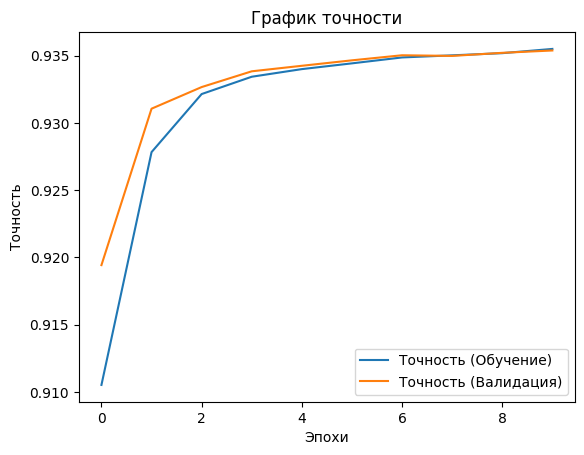

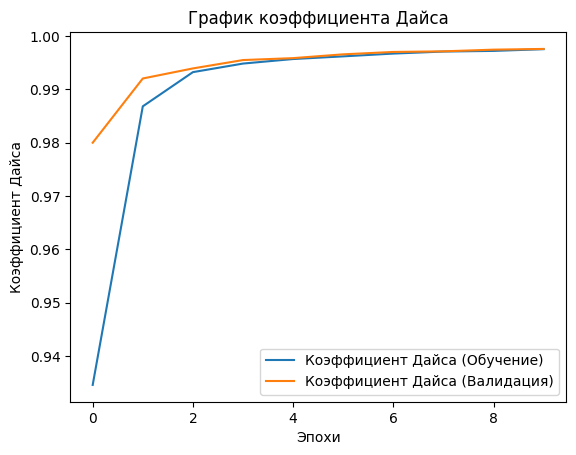

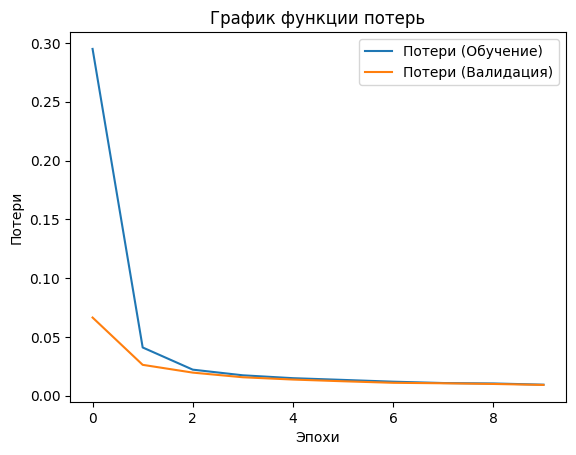

In [ ]:
# Получение истории обучения
history = model.history

# Визуализация графика точности
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('График точности')
plt.xlabel('Эпохи')
plt.ylabel('Точность')
plt.legend(['Точность (Обучение)', 'Точность (Валидация)'])
plt.show()

# Визуализация графика коэффициента Дайса
plt.plot(history.history['dice_coefficient'])
plt.plot(history.history['val_dice_coefficient'])
plt.title('График коэффициента Дайса')
plt.xlabel('Эпохи')
plt.ylabel('Коэффициент Дайса')
plt.legend(['Коэффициент Дайса (Обучение)', 'Коэффициент Дайса (Валидация)'])
plt.show()

# Визуализация графика функции потерь
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('График функции потерь')
plt.xlabel('Эпохи')
plt.ylabel('Потери')
plt.legend(['Потери (Обучение)', 'Потери (Валидация)'])
plt.show()


Для задачи U-Net автосегментации изображений по маскам хорошо подходит метрика сходства Жаккара (Jaccard similarity) или коэффициент Дайса (Dice coefficient). Эти метрики измеряют сходство между предсказанными и истинными масками.

Коэффициент Дайса определяется как отношение удвоенной площади пересечения между предсказанной и истинной масками к сумме площадей этих масок. Он выражается формулой:

Dice = (2 * |Predicted ∩ True|) / (|Predicted| + |True|)

где |Predicted| обозначает площадь предсказанной маски, |True| обозначает площадь истинной маски, а |Predicted ∩ True| обозначает площадь их пересечения.

For the task of U-Net image segmentation using masks, the Jaccard similarity (Jaccard index) or Dice coefficient are well-suited metrics. These metrics measure the similarity between the predicted and true masks.

The Dice coefficient is defined as the ratio of twice the intersection area between the predicted and true masks to the sum of their areas. It can be expressed by the formula:

Dice = (2 * |Predicted ∩ True|) / (|Predicted| + |True|)

where |Predicted| represents the area of the predicted mask, |True| represents the area of the true mask, and |Predicted ∩ True| represents the area of their intersection.

In [ ]:
history = model.history.history

dice_coefficient = history['dice_coefficient']  # Получение значений коэффициента Дайса
val_dice_coefficient = history['val_dice_coefficient']  # Получение значений коэффициента Дайса на валидации

# Вывод точности модели по коэффициенту Дайса
print("Точность модели по коэффициенту Дайса:")
for epoch in range(len(dice_coefficient)):
    accuracy = dice_coefficient[epoch] * 100
    val_accuracy = val_dice_coefficient[epoch] * 100
    print(f"Эпоха {epoch + 1}: Обучение - {accuracy:.2f}%, Валидация - {val_accuracy:.2f}%")

Точность модели по коэффициенту Дайса:
Эпоха 1: Обучение - 93.46%, Валидация - 98.00%
Эпоха 2: Обучение - 98.68%, Валидация - 99.20%
Эпоха 3: Обучение - 99.32%, Валидация - 99.39%
Эпоха 4: Обучение - 99.48%, Валидация - 99.55%
Эпоха 5: Обучение - 99.57%, Валидация - 99.58%
Эпоха 6: Обучение - 99.62%, Валидация - 99.65%
Эпоха 7: Обучение - 99.67%, Валидация - 99.70%
Эпоха 8: Обучение - 99.71%, Валидация - 99.71%
Эпоха 9: Обучение - 99.72%, Валидация - 99.74%
Эпоха 10: Обучение - 99.75%, Валидация - 99.76%


In [ ]:
# Путь для сохранения модели
model_path = "/content/drive/MyDrive/хакатон/unet_model.h5"

# Сохранение модели
model.save(model_path)

далее протестируем модель на случайных картинках которых не было при обучении. Результат можно увидеть ниже

Next, we will test the model on randomly selected images that were not included in the training. The results can be seen below.

1/1 [==============================] - 1s 1s/step


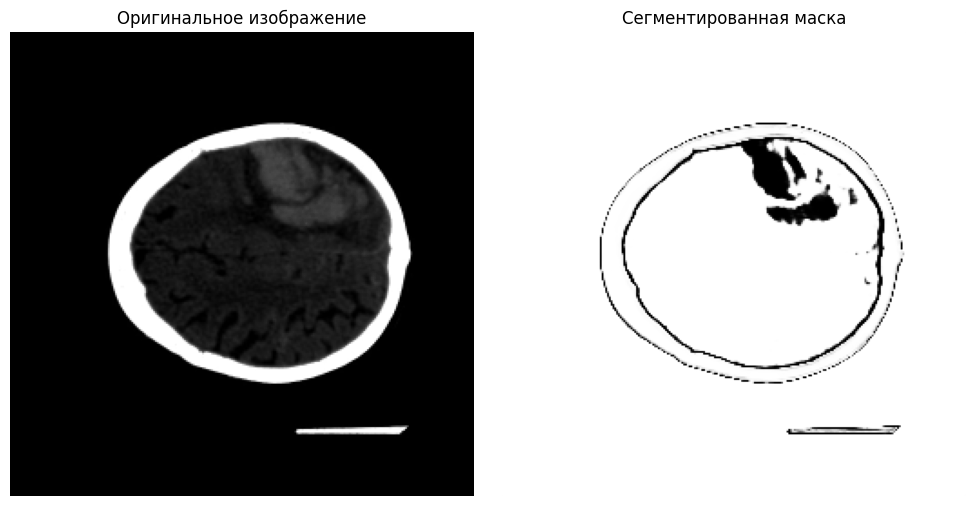

1/1 [==============================] - 0s 20ms/step


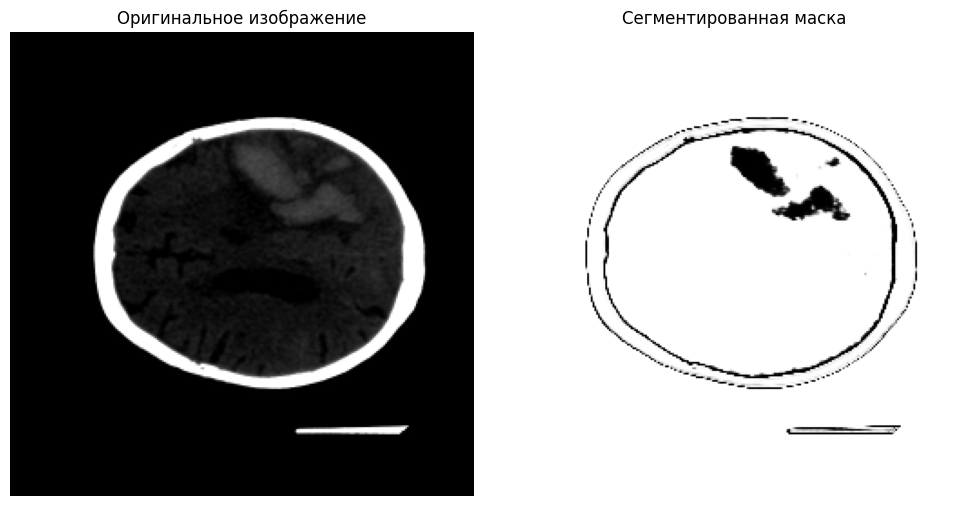

1/1 [==============================] - 0s 19ms/step


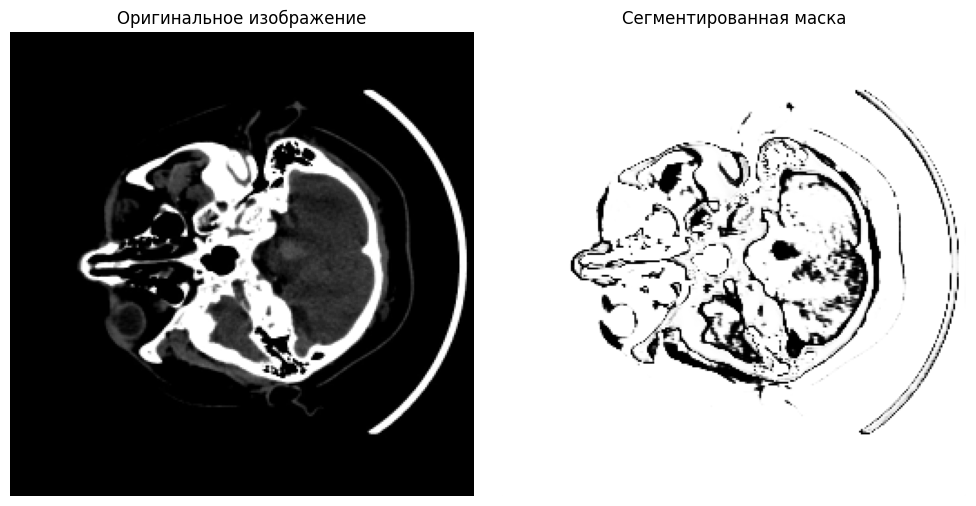

1/1 [==============================] - 0s 20ms/step


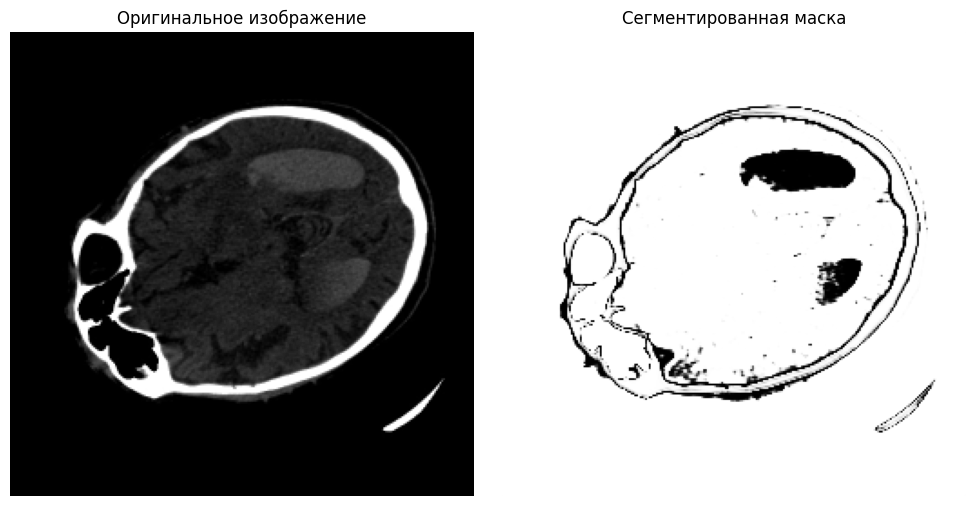

1/1 [==============================] - 0s 19ms/step


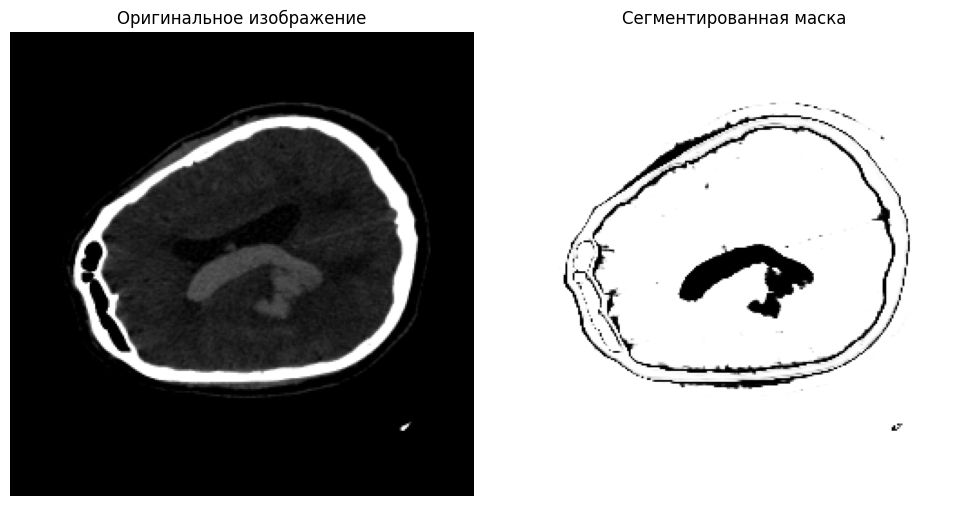

1/1 [==============================] - 0s 21ms/step


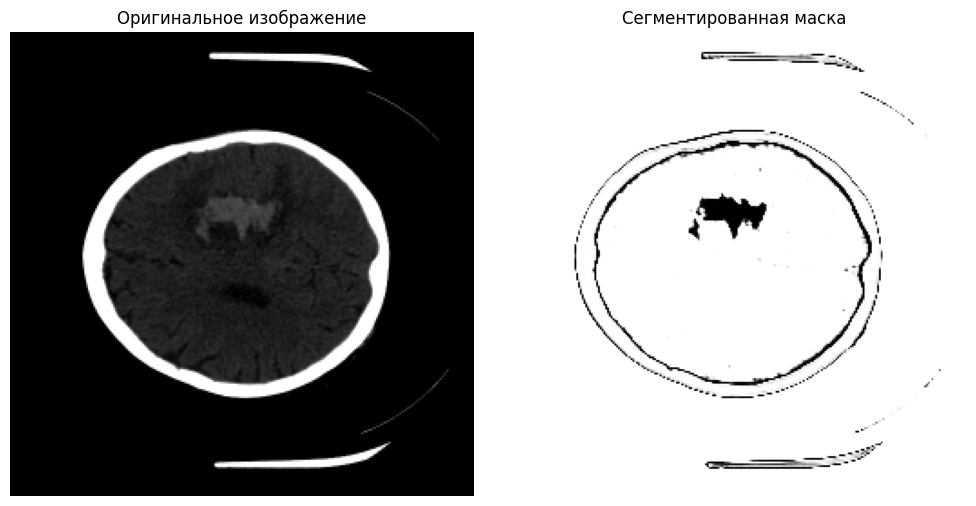

1/1 [==============================] - 0s 19ms/step


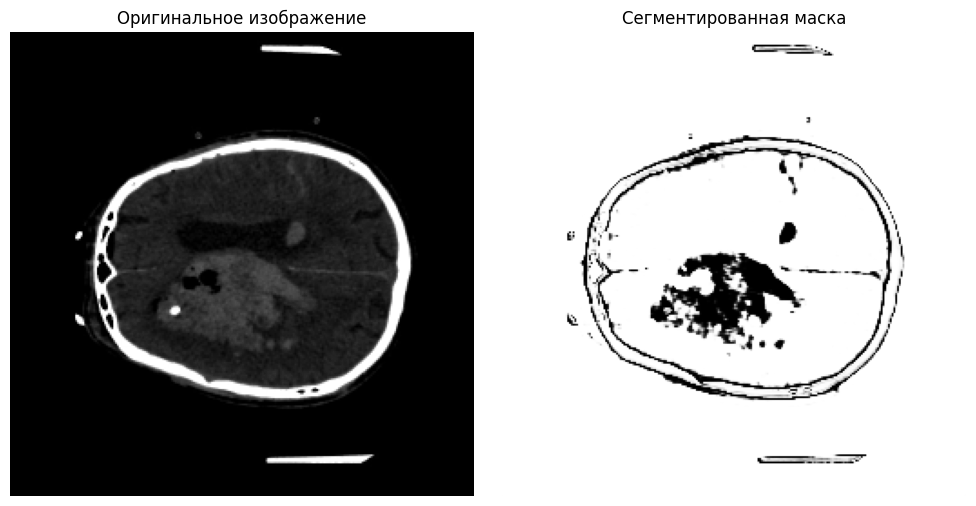

1/1 [==============================] - 0s 22ms/step


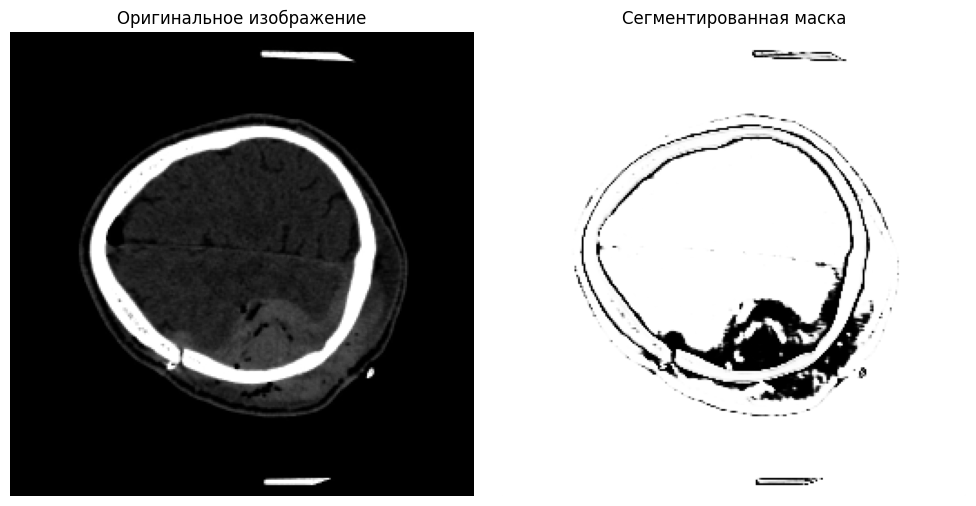

1/1 [==============================] - 0s 30ms/step


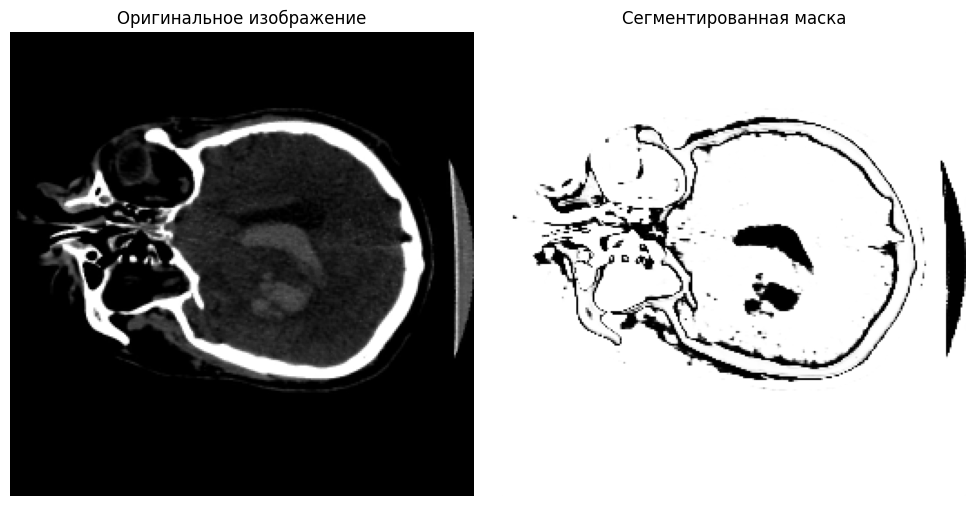

In [ ]:
# Путь к папке с картинками
images_folder = "/content/drive/MyDrive/хакатон/тестовые_картинки"

# Получение списка файлов картинок в папке
image_files = os.listdir(images_folder)

# Применение модели к каждой картинке и вывод результатов
for image_file in image_files:
    # Полный путь к текущей картинке
    image_path = os.path.join(images_folder, image_file)

    # Загрузка и предобработка текущей картинки
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (256, 256))  # Изменение размера до 256x256
    image = image / 255.0  # Нормализация значений пикселей
    image = np.expand_dims(image, axis=-1)  # Добавление размерности канала

    # Применение модели к текущей картинке
    segmented_mask = model.predict(np.array([image]))

    # Отображение результатов
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))

    axs[0].imshow(image[:, :, 0], cmap='gray')
    axs[0].set_title('Оригинальное изображение')
    axs[0].axis('off')

    axs[1].imshow(segmented_mask[0, :, :, 0], cmap='gray')
    axs[1].set_title('Сегментированная маска')
    axs[1].axis('off')

    plt.tight_layout()
    plt.show()

# **Вывод-резюме-предложения**

-Были использованы только снимки мрт, никакие другие данные не использовались.

-Снимки МРТ подвергнуты автосегментации методом водораздела и др. методами.

-Сам по себе метод водораздела показывает хорошие результаты для автосегментации, по крайней мере по моему мнению, поэтому был выбран как основной подход можно сменить на ваше усмотрение.

-полученные маски использованы для обучения U-net. (Только с применением водораздела, ручные способы не применялись)

-Точность модели крайне высока.


Таким образом мы видим, что модель теперь в состоянии сегментировать изображения самостоятельно.

**Предложения**

-можно попробовать обучить модель отделять мозг от черепной коробки и внешнего окружения, а затем сегментировать отдельно мозг на аномалии.

-можно обучить нейронную сеть только на нормальных мрт снимках, а затем сделать нейронную сеть для поиска аномалий.
________________________________________

**Summary Sentence**

Only MRI scans were used, no other data was utilized.

The MRI scans were subjected to auto-segmentation using methods like watershed segmentation and others.

The watershed segmentation method itself shows good results for auto-segmentation, in my opinion, so it was chosen as the primary approach. You may change it at your discretion.

The obtained masks were used for training the U-Net model. (Only with the application of watershed segmentation, manual methods were not used)

The model's accuracy is extremely high.
Thus, we see that the model is now capable of segmenting images independently.

**Suggestions**

We can attempt to train the model to separate the brain from the skull and the surrounding environment, and then segment the brain for anomalies.

We can train a neural network only on normal MRI scans, and then develop a neural network for anomaly detection.